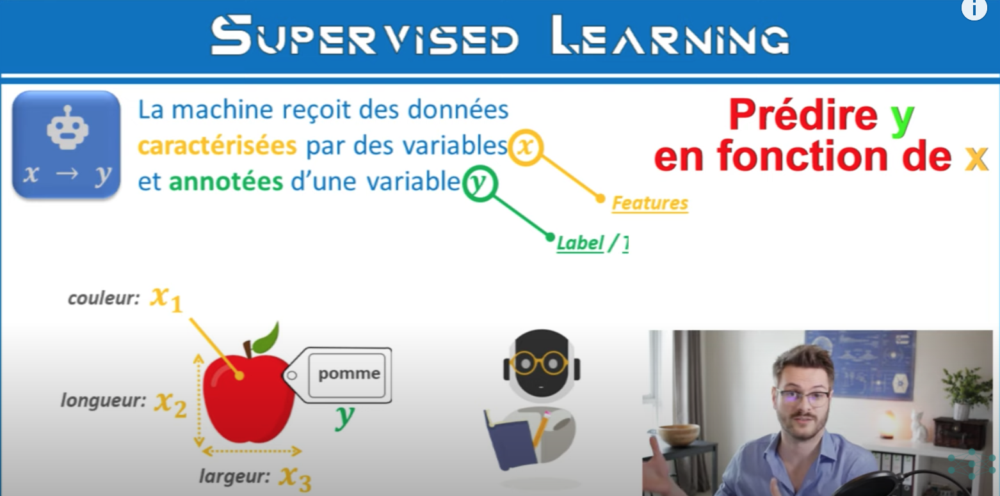

- SI Y EST CONTINUE ALORS ELLE EST UN NOMBRE FINIS
- SI Y EST DITES DISCRÉTE ALORS C'EST UNE VARIABLE NON FINIS MAIS QUI REPRÉSENTERA UNE CLASSE

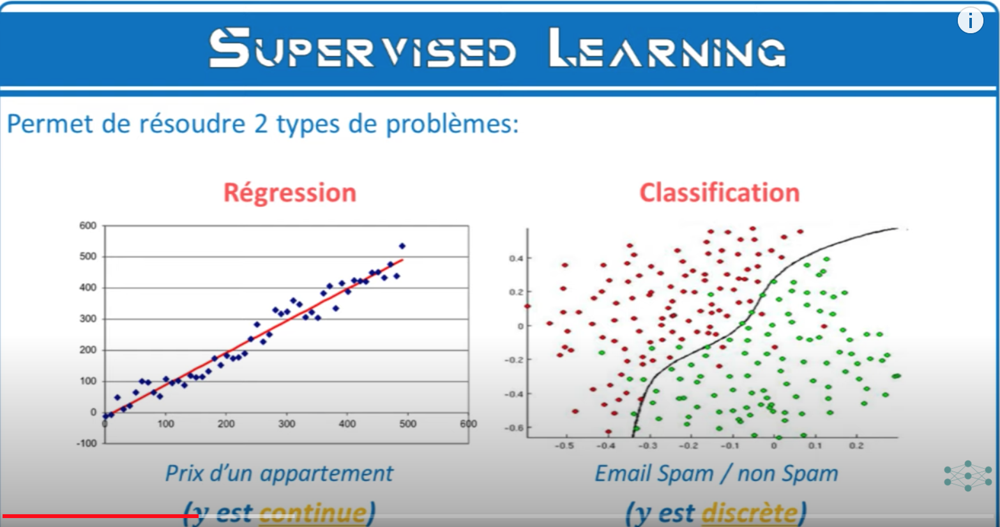

dans scikit learn pour créer un modèle on crée un objet de la classe de ce modèle (un estimateur dans scikit learn)

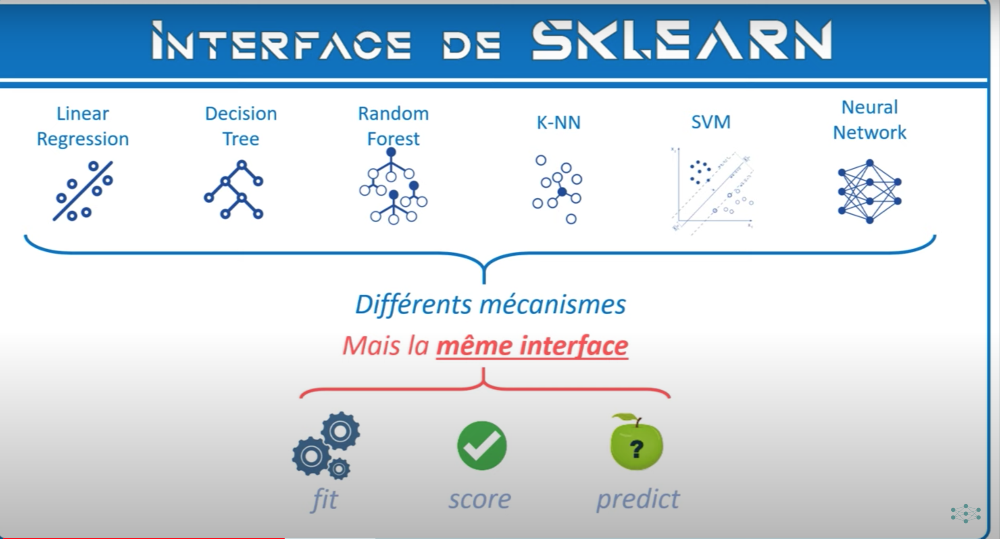

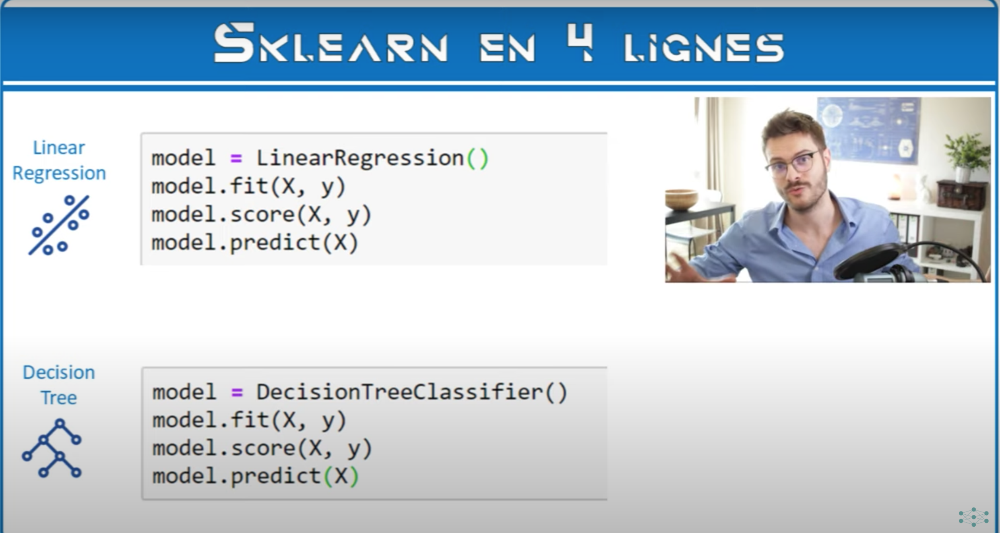

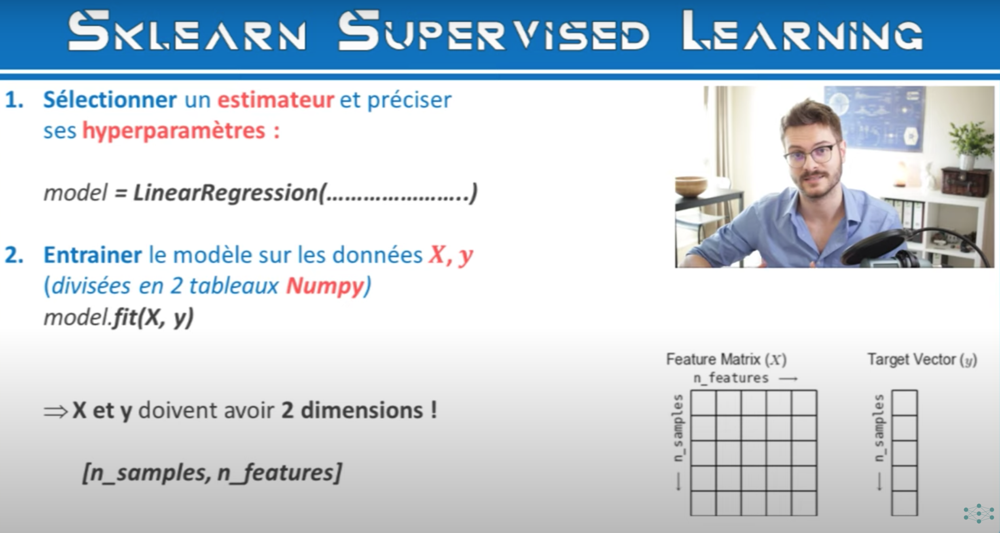

- on rappelle que y lui doit avoir une première dimensions représentant le nombre de lots et une deuxième en dimension 1 car elle représente le nombre de target
- Pour X on a n_sample qui est le nombre de lot et n_features qui représente le nombre de features

à la suite de cela on évalue modèle avec model.score(X, y)

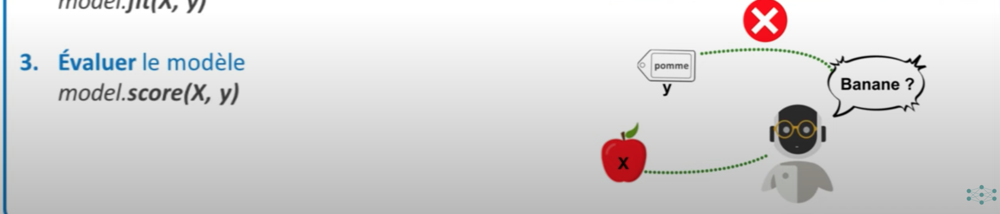

une fois satisfait on peut utiliser le modèle pour prédire nos données

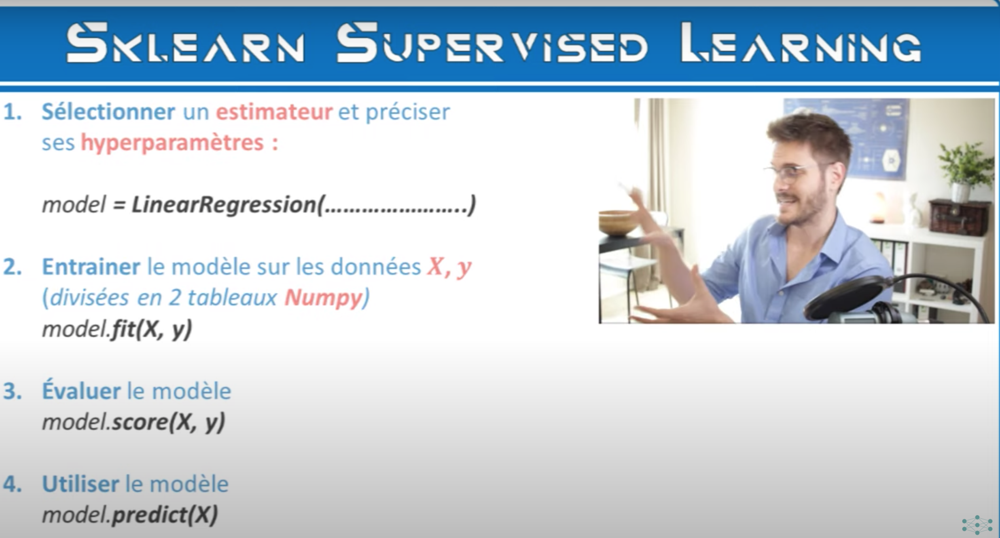

carte pour savoir quel algorithme utilisé

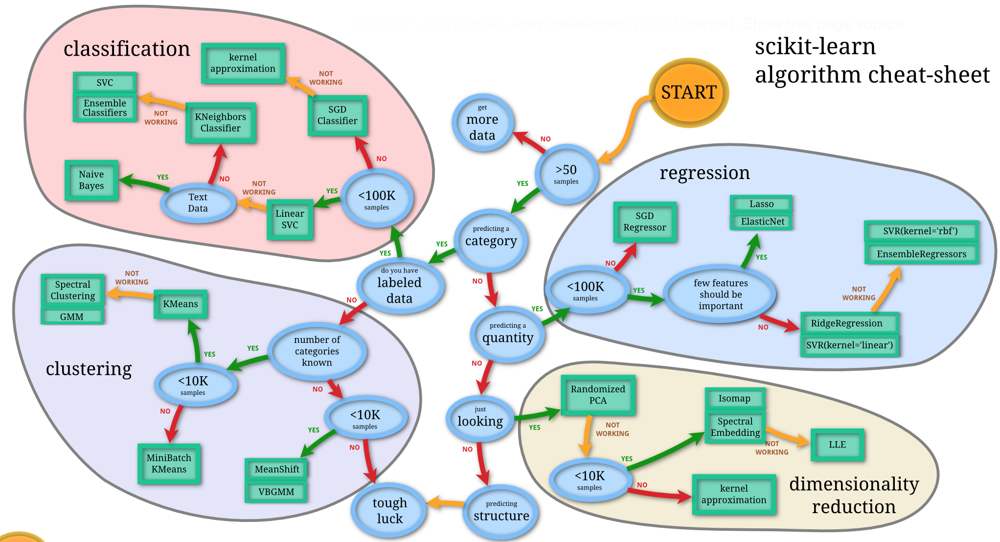

# Linear Regression

In [17]:
import numpy as np
import matplotlib.pyplot as plt

np.random.seed(0)
m = 100 # creating 100 samples (100 lots)
X = np.linspace(0, 10, m).reshape(m, 1)
y = X +np.random.randn(m, 1)
print(X.shape)
print(y.shape)

(100, 1)
(100, 1)


In [13]:
from sklearn.linear_model import LinearRegression

model = LinearRegression()
model.fit(X , y)
model.score(X, y)

0.8881140743377214

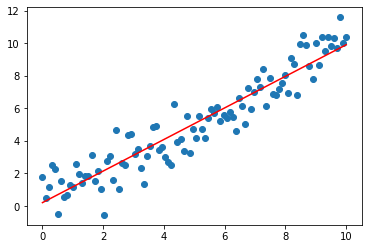

In [14]:
# predictions va contenir un vecteur avec tous nos résultats prédit pour chaque ligne de X
predictions = model.predict(X)

plt.scatter(X, y)
plt.plot(X, predictions, c='r')

# Classification

## Exemple

In [59]:
import pandas as pd
import seaborn as sns

titanic = sns.load_dataset('titanic')
titanic.shape
titanic.head()

,survived,pclass,sex,age,sibsp,parch,fare,embarked,class,who,adult_male,deck,embark_town,alive,alone
0,0,3,male,22.0,1,0,7.2500,S,Third,man,True,NaN,Southampton,no,False
1,1,1,female,38.0,1,0,71.2833,C,First,woman,False,C,Cherbourg,yes,False
2,1,3,female,26.0,0,0,7.9250,S,Third,woman,False,NaN,Southampton,yes,True
3,1,1,female,35.0,1,0,53.1000,S,First,woman,False,C,Southampton,yes,False
4,0,3,male,35.0,0,0,8.0500,S,Third,man,True,NaN,Southampton,no,True


In [60]:
# garder suelemnt certaines colonnes
titanic = titanic[['survived', 'pclass', 'sex', 'age']]
# les inplace de faire un titanic = titanic.dropna(axis=0)
titanic.dropna(axis=0, inplace=True)
# pareil que au dessus pour le inplace
# on remplace par des nombres des catégories car pour faire du machine learning il faut des mots
titanic['sex'].replace(['male', 'female'], [0,1], inplace=True)
titanic.head()

,survived,pclass,sex,age
0,0,3,0,22.0
1,1,1,1,38.0
2,1,3,1,26.0
3,1,1,1,35.0
4,0,3,0,35.0


In [21]:
from sklearn.neighbors import KNeighborsClassifier
# tout d'abord on va séparer notre dataframe en X pour les features et Y pour les targets

In [61]:
# permet d'affecter toute la colonne survived à y
y = titanic['survived']
y.head()

0    0
1    1
2    1
3    1
4    0
Name: survived, dtype: int64

In [62]:
X = titanic.drop('survived', axis=1)
X.head()
# toujours un dataframe mais ça ne pose pas de problèmes on peut travailler avec

,pclass,sex,age
0,3,0,22.0
1,1,1,38.0
2,3,1,26.0
3,1,1,35.0
4,3,0,35.0


In [63]:
model = KNeighborsClassifier()
model.fit(X, y)
model.score(X, y)
# 83% de chances d'avoir une bonne réponse

0.8319327731092437

In [64]:
# on simule les préductions de X
print(X.shape)
predictions = model.predict(X)

(714, 3)


(714,)


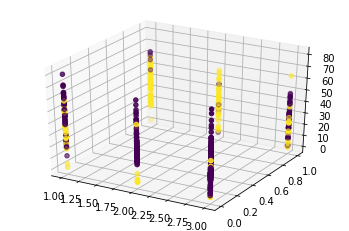

In [65]:
# pas fou comme graphique mais on peut voir que beaucoup d'homme en 3ème classe sont mort
from mpl_toolkits.mplot3d import Axes3D
ax = plt.axes(projection='3d')
print(predictions.shape)
ax.scatter(X['pclass'], X['sex'], X['age'], c=predictions)

In [66]:
# fonction pour savoir si suivant des paramètres on survit ou non
def survie(model, pclass=3, sex=0, age=26):
    # on rentre les valeurs comme notre modèle a été entrainé
    # et oublie pas de RESHAPE sinon notre tableau ne possédera qu'une dimension(3,)
    x = np.array([pclass, sex, age]).reshape(1,3)
    print(model.predict(x))
    # savoir le porucentage de chanse d'appartenir à une classe ou une autre
    print(model.predict_proba(x))

In [67]:
survie(model)
# ici on voit qu'on a pas survécu avec ces données
# on voit qu'on avait 60 % de chances de mourir d'après ces %

[0]
[[0.6 0.4]]


# Exercice 
## modifier le nombre de voisins de l'algorithme KNeighbors pour voir quel est le paramètre qui donne les meilleurs résultats

1 voisins = 0.8473389355742297
2 voisins = 0.8585434173669467
3 voisins = 0.8585434173669467
4 voisins = 0.8403361344537815
5 voisins = 0.8319327731092437
6 voisins = 0.8221288515406162
7 voisins = 0.8207282913165266
8 voisins = 0.8109243697478992
9 voisins = 0.8179271708683473
10 voisins = 0.8053221288515406
11 voisins = 0.819327731092437
12 voisins = 0.7913165266106442
13 voisins = 0.8067226890756303
14 voisins = 0.7857142857142857
15 voisins = 0.788515406162465
16 voisins = 0.7941176470588235
17 voisins = 0.7941176470588235
18 voisins = 0.7941176470588235
19 voisins = 0.7871148459383753
20 voisins = 0.7633053221288515
21 voisins = 0.773109243697479
22 voisins = 0.7745098039215687
23 voisins = 0.773109243697479
24 voisins = 0.7605042016806722
25 voisins = 0.7675070028011205
26 voisins = 0.7563025210084033
27 voisins = 0.7675070028011205
28 voisins = 0.7492997198879552
29 voisins = 0.7605042016806722
2
0.8585434173669467


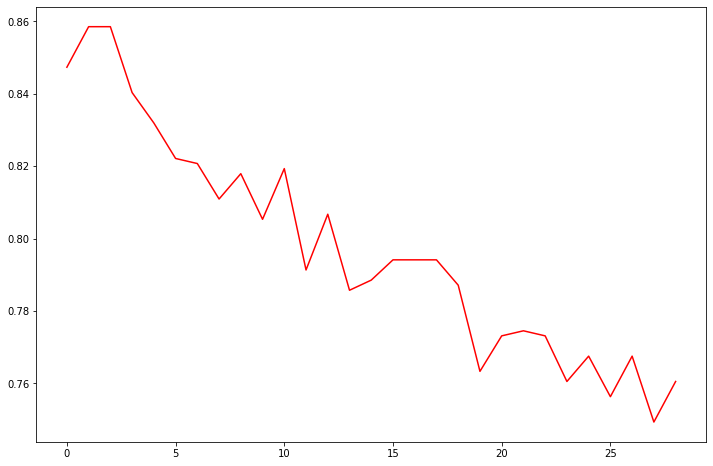

In [73]:
result = []
best_k = 1
best_score = 0
for k in range(1,30):
    model = KNeighborsClassifier(n_neighbors=k)
    model.fit(X, y)
    result.append(model.score(X, y))
    print(f'{k} voisins = {model.score(X, y)}')
    
    if best_score < model.score(X, y):
        best_k = k
        best_score = model.score(X, y)

        
print(best_k)
print(best_score)
plt.figure(figsize=(12, 8))
plt.plot(result, c='r')

# Correction

## l'exercice est bon mais on sait que cette approche est mauvaise
- 1) Créer un Train set et un Test set. Entraner puis évaluer
- 2) Avec GridSearch, trouver les meilleurs hyper-parametres n_neighbors, metrics et weights
- 3) Est-ce que collecter plus de données serait utile ? (learning_rate)

In [103]:
from sklearn.model_selection import train_test_split

titanic = sns.load_dataset('titanic')
titanic = titanic[['survived', 'pclass', 'sex', 'age']]
titanic = titanic.dropna()
y = titanic['survived']
X = titanic[['pclass', 'sex', 'age']]
X['sex'] = X['sex'].astype('category').cat.codes
print(y.shape)
print(X)
print(X.shape)

(714,)
     pclass  sex   age
0         3    1  22.0
1         1    0  38.0
2         3    0  26.0
3         1    0  35.0
4         3    1  35.0
..      ...  ...   ...
885       3    0  39.0
886       2    1  27.0
887       1    0  19.0
889       1    1  26.0
890       3    1  32.0

[714 rows x 3 columns]
(714, 3)


/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  


In [104]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2)
print(X_train.shape)
print(y_test.shape)

(571, 3)
(143,)


In [108]:
from sklearn.model_selection import GridSearchCV

# on setup les autres hyper paramètres de notre algorithme
param_grid = {'n_neighbors': np.arange(1, 30),
             'metric': ['euclidean', 'manhattan']}

grid = GridSearchCV(KNeighborsClassifier(), param_grid, cv=5)
grid.fit(X_train, y_train)

GridSearchCV(cv=5, error_score=nan,
             estimator=KNeighborsClassifier(algorithm='auto', leaf_size=30,
                                            metric='minkowski',
                                            metric_params=None, n_jobs=None,
                                            n_neighbors=5, p=2,
                                            weights='uniform'),
             iid='deprecated', n_jobs=None,
             param_grid={'metric': ['euclidean', 'manhattan'],
                         'n_neighbors': array([ 1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16, 17,
       18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29])},
             pre_dispatch='2*n_jobs', refit=True, return_train_score=False,
             scoring=None, verbose=0)

In [109]:
grid.best_score_

0.7670938215102975

In [110]:
grid.best_params_

{'metric': 'manhattan', 'n_neighbors': 9}

In [111]:
model = grid.best_estimator_
model.score(X_test, y_test)

0.8111888111888111

[ 45  91 136 182 228 273 319 364 410 456]


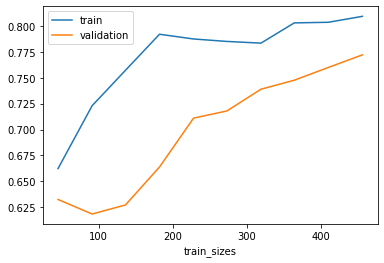

In [112]:
from sklearn.model_selection import learning_curve

N , train_score, val_score = learning_curve(model, X_train, y_train, train_sizes=np.linspace(0.1, 1.0, 10), cv=5)
print(N)
plt.plot(N, train_score.mean(axis=1), label='train')
plt.plot(N, val_score.mean(axis=1), label='validation')
plt.xlabel('train_sizes')
plt.legend()